In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3 as sql
import numpy as np
import warnings
import scipy.stats as stats

warnings.filterwarnings('ignore')

In [17]:
import importlib
import sys
import os
parent_dir = os.path.dirname(os.path.dirname(os.path.abspath('')))

print(parent_dir)
sys.path.insert(0,parent_dir)
import data_manipulation.data_transform as dat

importlib.reload(dat)

/home/cody/Documents/DataSciBC/EPLTransfer


<module 'data_manipulation.data_transform' from '/home/cody/Documents/DataSciBC/EPLTransfer/data_manipulation/data_transform.py'>

In [18]:
main_data_path = "../../data/main_data/train/train.csv"
train = pd.read_csv(main_data_path)
train

,name,dob,pos,height,foot,date,market_value,minutesPlayed,totalLongBalls,keyPass,...,red_card,rating,accuratePass,accurateLongBalls,accurateCross,accurateKeeperSweeper,expectedAssists,expectedGoals,xGChain,xGBuildup
0,matheus bueno,1998-07-29,M,178.0,right,2023-01-22,350000.0,1216,66,19,...,0.0,6.339024,11.975610,1.024390,0.146341,0.0,0.000000,0.000000,0.000000,0.000000
1,renaud cohade,1984-09-28,M,180.0,right,2019-12-21,500000.0,8050,596,134,...,1.0,6.851456,36.631068,3.388350,1.048544,0.0,0.109308,0.041139,0.208742,0.139566
2,pedro santos,2003-02-09,M,178.0,left,2024-10-05,1700000.0,172,2,3,...,0.0,6.571429,4.571429,0.000000,0.285714,0.0,0.014126,0.006329,0.000000,0.000000
3,sergio busquets,1988-07-15,M,189.0,right,2023-05-28,5000000.0,21485,1470,185,...,1.0,6.376159,57.046358,3.754967,0.029801,0.0,0.069270,0.016251,0.648687,0.604063
4,sergio garcia,1996-12-26,F,176.0,right,2015-05-23,6000000.0,0,0,0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.179295,0.572958,0.442113,0.061499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9402,simeon jackson,1987-03-27,F,173.0,right,2016-05-07,400000.0,449,3,3,...,0.0,6.194118,3.823529,0.117647,0.058824,0.0,0.000000,0.000000,0.000000,0.000000
9403,ben godfrey,1998-01-14,D,183.0,right,2024-08-19,10000000.0,11984,620,35,...,1.0,6.578523,33.617450,1.657718,0.080537,0.0,0.015757,0.040026,0.110679,0.098402
9404,ashley cole,1980-12-19,D,176.0,left,2019-05-27,500000.0,656,11,4,...,0.0,2.900000,12.333333,0.285714,0.190476,0.0,0.009612,0.017789,0.222928,0.197106
9405,helder guedes,1987-05-06,F,177.0,right,2020-07-13,200000.0,6573,23,49,...,0.0,6.626923,8.144231,0.096154,0.028846,0.0,0.000000,0.000000,0.000000,0.000000


In [19]:
train.columns

Index(['name', 'dob', 'pos', 'height', 'foot', 'date', 'market_value',
       'minutesPlayed', 'totalLongBalls', 'keyPass', 'totalPass', 'totalCross',
       'goalAssist', 'savedShotsFromInsideTheBox', 'saves',
       'totalKeeperSweeper', 'goalsPrevented', 'touches', 'possessionLostCtrl',
       'dispossessed', 'aerialLost', 'aerialWon', 'duelLost', 'duelWon',
       'challengeLost', 'outfielderBlock', 'totalContest', 'interceptionWon',
       'wonContest', 'totalTackle', 'totalClearance', 'blockedScoringAttempt',
       'hitWoodwork', 'bigChanceCreated', 'bigChanceMissed', 'shotOffTarget',
       'onTargetScoringAttempt', 'goals', 'wasFouled', 'fouls', 'totalOffside',
       'yellow_card', 'red_card', 'rating', 'accuratePass',
       'accurateLongBalls', 'accurateCross', 'accurateKeeperSweeper',
       'expectedAssists', 'expectedGoals', 'xGChain', 'xGBuildup'],
      dtype='object')

In [20]:
train = dat.transformer(train,EDA=True).data

In [21]:
train

,pos,height,foot,market_value,minutesPlayed,totalLongBalls,keyPass,totalPass,totalCross,goalAssist,...,rating,accuratePass,accurateLongBalls,accurateCross,accurateKeeperSweeper,expectedAssists,expectedGoals,xGChain,xGBuildup,age
0,M,178.0,right,12.765691,1216,66,19,603,36,1,...,6.339024,11.975610,1.024390,0.146341,0.0,0.000000,0.000000,0.000000,0.000000,24.0
1,M,180.0,right,13.122365,8050,596,134,4812,358,9,...,6.851456,36.631068,3.388350,1.048544,0.0,0.109308,0.041139,0.208742,0.139566,35.0
2,M,178.0,left,14.346139,172,2,3,40,7,0,...,6.571429,4.571429,0.000000,0.285714,0.0,0.014126,0.006329,0.000000,0.000000,21.0
3,M,189.0,right,15.424949,21485,1470,185,19210,19,23,...,6.376159,57.046358,3.754967,0.029801,0.0,0.069270,0.016251,0.648687,0.604063,34.0
4,F,176.0,right,15.607270,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.179295,0.572958,0.442113,0.061499,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9402,F,173.0,right,12.899222,449,3,3,84,9,1,...,6.194118,3.823529,0.117647,0.058824,0.0,0.000000,0.000000,0.000000,0.000000,29.0
9403,D,183.0,right,16.118096,11984,620,35,5937,56,5,...,6.578523,33.617450,1.657718,0.080537,0.0,0.015757,0.040026,0.110679,0.098402,26.0
9404,D,176.0,left,13.122365,656,11,4,299,13,2,...,2.900000,12.333333,0.285714,0.190476,0.0,0.009612,0.017789,0.222928,0.197106,38.0
9405,F,177.0,right,12.206078,6573,23,49,1211,22,8,...,6.626923,8.144231,0.096154,0.028846,0.0,0.000000,0.000000,0.000000,0.000000,33.0


# Target Exploration and Distribution

In [22]:
target = 'market_value'

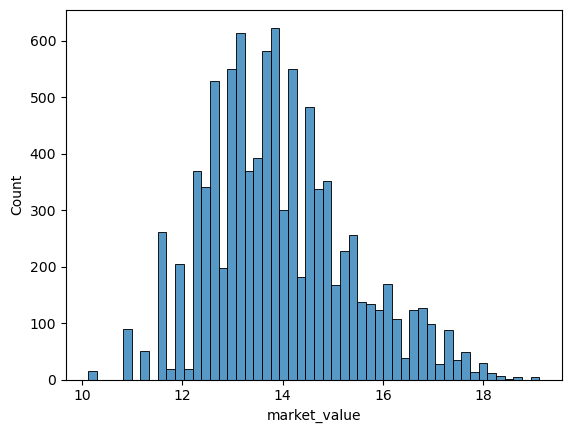

In [23]:
sns.histplot(train,x=target)
plt.show()

In [24]:
# Skewness and Kurtosis
print(f'Skewness: {train[target].skew()}')
print(f'Kurtosis: {train[target].kurt()}')

Skewness: 0.48617147116418924
Kurtosis: 0.07468884091554706


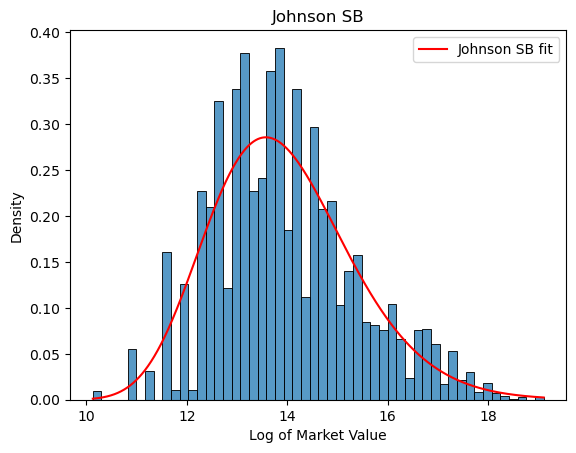

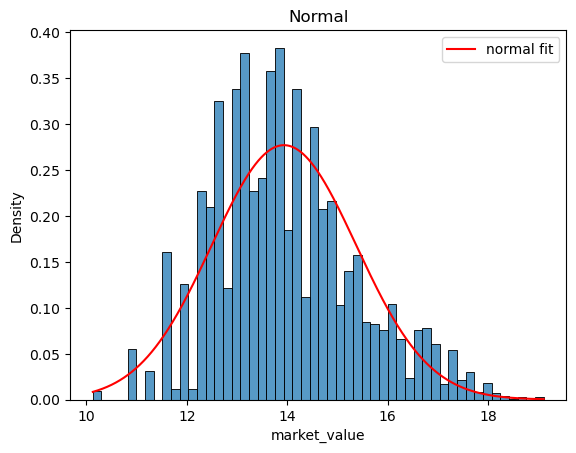

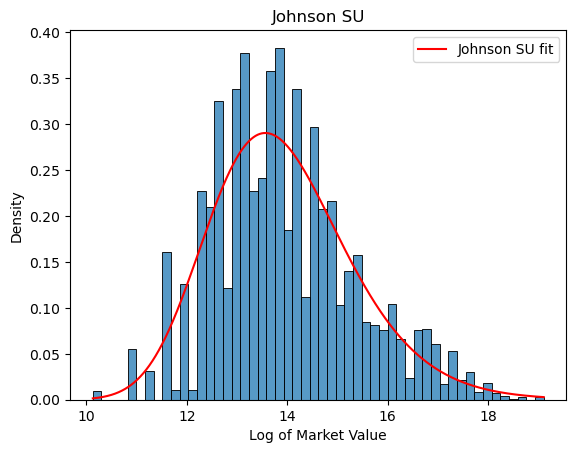

In [25]:
target_col = train[target]
x=np.linspace(min(target_col),max(target_col),100000)
plt.figure(1)
plt.title('Johnson SB')
plt.xlabel('Log of Market Value')
sns.histplot(data=train,x=target,stat='density')
john = stats.johnsonsb.fit(target_col)
plt.plot(x,stats.johnsonsb.pdf(x,*john),'r-',label='Johnson SB fit')
plt.legend()

plt.figure(2)
plt.title('Normal')
sns.histplot(data=train,x=target,stat='density')
mu,std = stats.norm.fit(target_col)
plt.plot(x,stats.norm.pdf(x,mu,std),'r-',label='normal fit')
plt.legend()

plt.figure(3)
plt.title('Johnson SU')
plt.xlabel('Log of Market Value')
sns.histplot(data=train,x=target,stat='density')
john = stats.johnsonsu.fit(target_col)
plt.plot(x,stats.johnsonsu.pdf(x,*john),'r-',label='Johnson SU fit')
plt.legend()
plt.show()

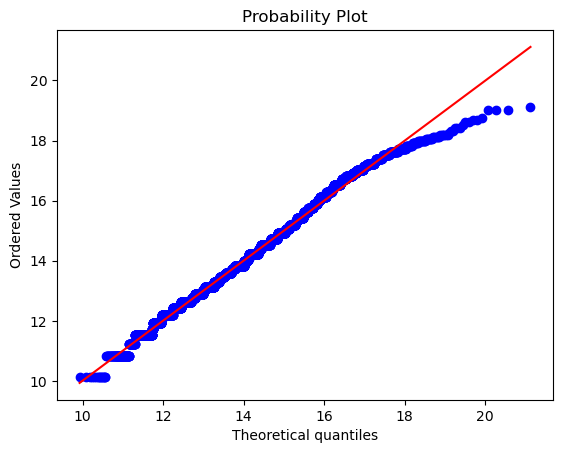

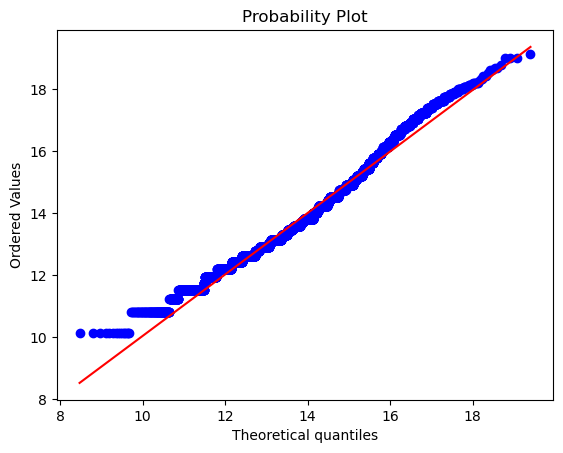

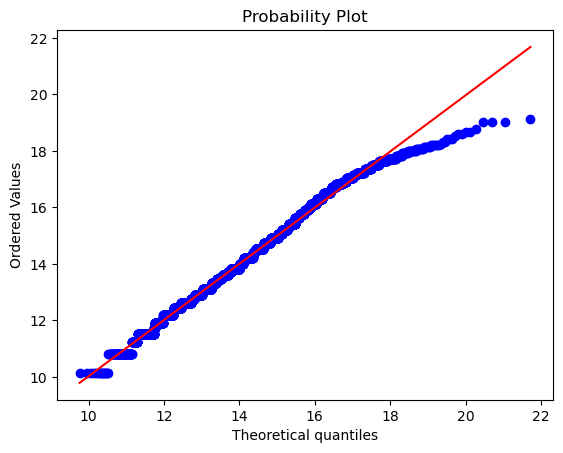

In [26]:
# QQ plot
plt.figure(1)
plt.title('Johnson SB')
john = stats.johnsonsb.fit(target_col)
stats.probplot(target_col,dist=stats.johnsonsb,sparams=john,plot=plt)

plt.figure(2)
plt.title('Normal')
norm_fit = stats.norm.fit(target_col)
stats.probplot(target_col,dist=stats.norm,sparams=norm_fit,plot=plt)

plt.figure(3)
plt.title('Johnson SU')
john = stats.johnsonsu.fit(target_col)
stats.probplot(target_col,dist=stats.johnsonsu,sparams=john,plot=plt)
plt.show()

When just taking the log of the target variables, we see that it is pretty close to normal or Johnson $S_B$ distribution, but it does have some skewness and kurtosis, which tells me that the Johnson $S_B$ distribution will probability be better.
One interesting thing is that dividing by 1million and then taking the log, gets us something that is very skewed.  

In [27]:
print(f"mean: {target_col.mean()}")
print(f"std: {target_col.std()}")
print(f"skewness: {target_col.skew()}")
print(f"Kurtosis: {target_col.kurt()}")
a,b,loc,scale = stats.johnsonsb.fit(target_col)
print(a,b,loc,scale)

mean: 13.936087371321914
std: 1.4404955338945142
skewness: 0.48617147116418924
Kurtosis: 0.07468884091554706
8.96648054357631 4.470272857560019 6.627995674729187 60.60631442076662


In [28]:
# Lets get quantiative columns:
def getNumericColumns(data):
    quantiative = [f for f in data.columns if data.dtypes[f] !='object']
    return quantiative
quant_f = getNumericColumns(train)
quant_f


['height',
 'market_value',
 'minutesPlayed',
 'totalLongBalls',
 'keyPass',
 'totalPass',
 'totalCross',
 'goalAssist',
 'savedShotsFromInsideTheBox',
 'saves',
 'totalKeeperSweeper',
 'goalsPrevented',
 'touches',
 'possessionLostCtrl',
 'dispossessed',
 'aerialLost',
 'aerialWon',
 'duelLost',
 'duelWon',
 'challengeLost',
 'outfielderBlock',
 'totalContest',
 'interceptionWon',
 'wonContest',
 'totalTackle',
 'totalClearance',
 'blockedScoringAttempt',
 'hitWoodwork',
 'bigChanceCreated',
 'bigChanceMissed',
 'shotOffTarget',
 'onTargetScoringAttempt',
 'goals',
 'wasFouled',
 'fouls',
 'totalOffside',
 'yellow_card',
 'red_card',
 'rating',
 'accuratePass',
 'accurateLongBalls',
 'accurateCross',
 'accurateKeeperSweeper',
 'expectedAssists',
 'expectedGoals',
 'xGChain',
 'xGBuildup',
 'age']

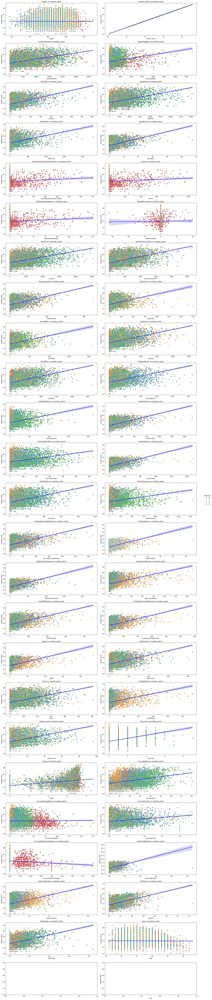

In [29]:
fig,axes = plt.subplots(ncols=2,nrows = int(len(quant_f)/2)+1,figsize=(20,100))
axes = axes.flatten()

for i, gs in enumerate(quant_f):
    
    sns.scatterplot(data=train,x=gs,y=target,hue='pos',ax=axes[i])
    sns.regplot(data=train,x=gs,y=target,scatter=False,ax=axes[i],color='blue')
    axes[i].set_title(f'{gs} vs market_value')
    axes[i].legend().remove()
    plt.xlabel(gs)
    plt.ylabel('market_value')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='Positions')
plt.tight_layout()
plt.legend()
plt.show()

In [30]:
# As we can see, certain stats are only important to goalkeepers, which we will need to extract our just for them.  

In [31]:
#normality test
stat , p=stats.shapiro(train[quant_f])
print(f'Statistics = {stat}, p={p}')
alpha = 0.05
if p<alpha:
    print(f'Sample looks Gaussian (fail to reject H0)')
else:
    print(f'Sample does not look Gaussian (reject H0)')

Statistics = 0.17775612871886082, p=5.3638896502162233e-216
Sample looks Gaussian (fail to reject H0)


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

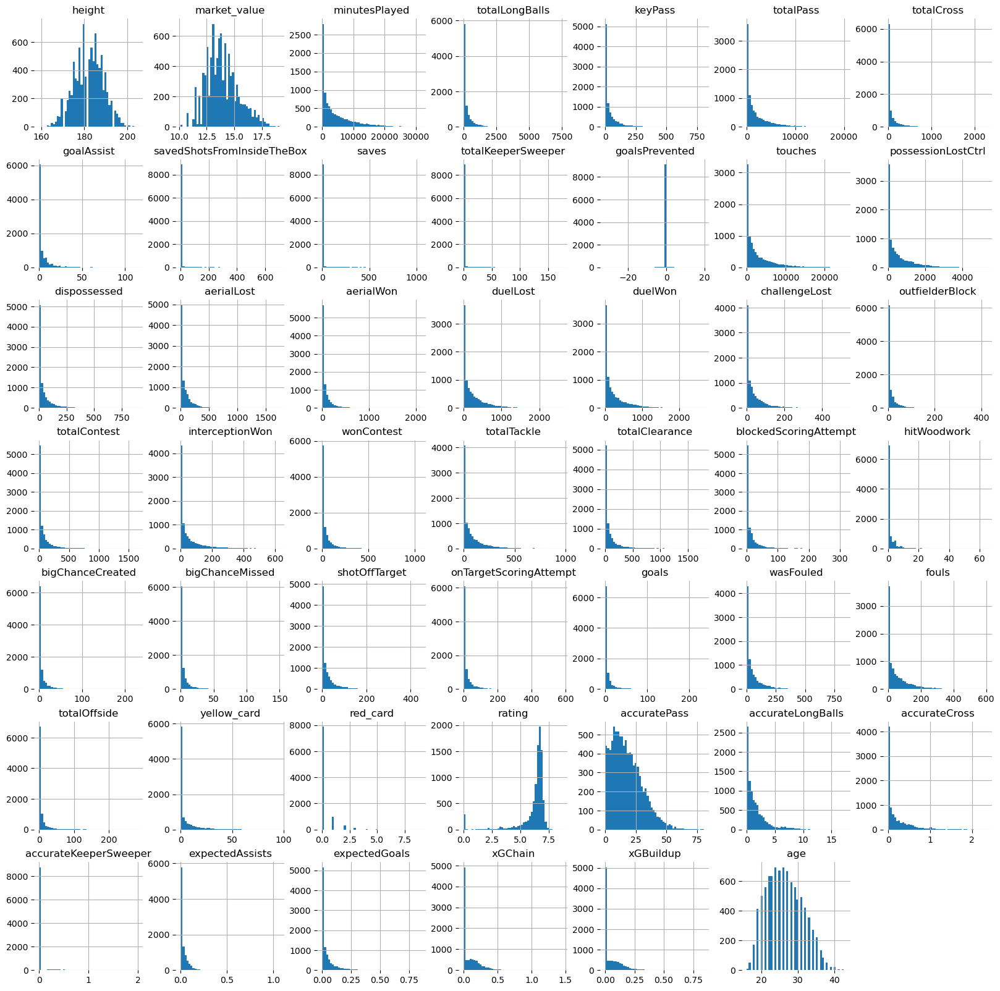

In [32]:
df = train[quant_f]
h = df.hist(bins=50,figsize=(20,20),xlabelsize='10',ylabelsize='10',xrot=-.15)
sns.despine(left=True,bottom=True)
[x.title.set_size(12) for x in h.ravel()]
[x.yaxis.tick_left() for x in h.ravel()]

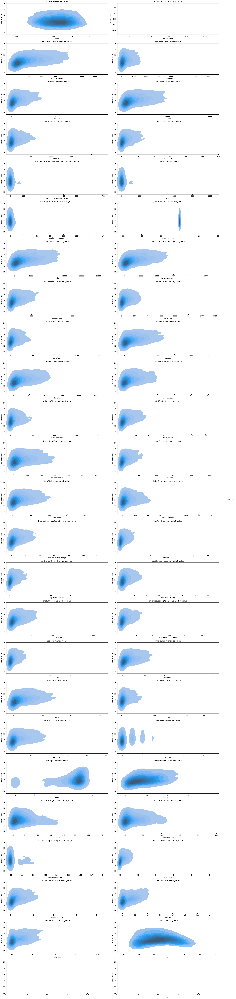

In [33]:
fig,axes = plt.subplots(ncols=2,nrows = int(len(quant_f)/2)+1,figsize=(20,90))
axes = axes.flatten()

for i, gs in enumerate(quant_f):
    
    sns.kdeplot(data=train,x=gs,y=target,fill=True,ax=axes[i])
    axes[i].set_title(f'{gs} vs market_value')
    axes[i].legend().remove()
    plt.xlabel(gs)
    plt.ylabel('market_value')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='Positions')
plt.tight_layout()
plt.legend()
plt.show()

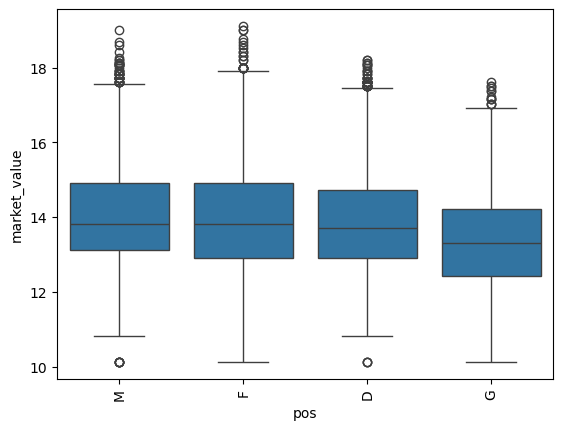

In [34]:

#df=scaled
plt.figure(1)

sns.boxplot(x=train['pos'],y=df[target])
plt.xticks(rotation=90)




plt.show()

<Axes: title={'center': 'Pearson Correlation Matrix'}>

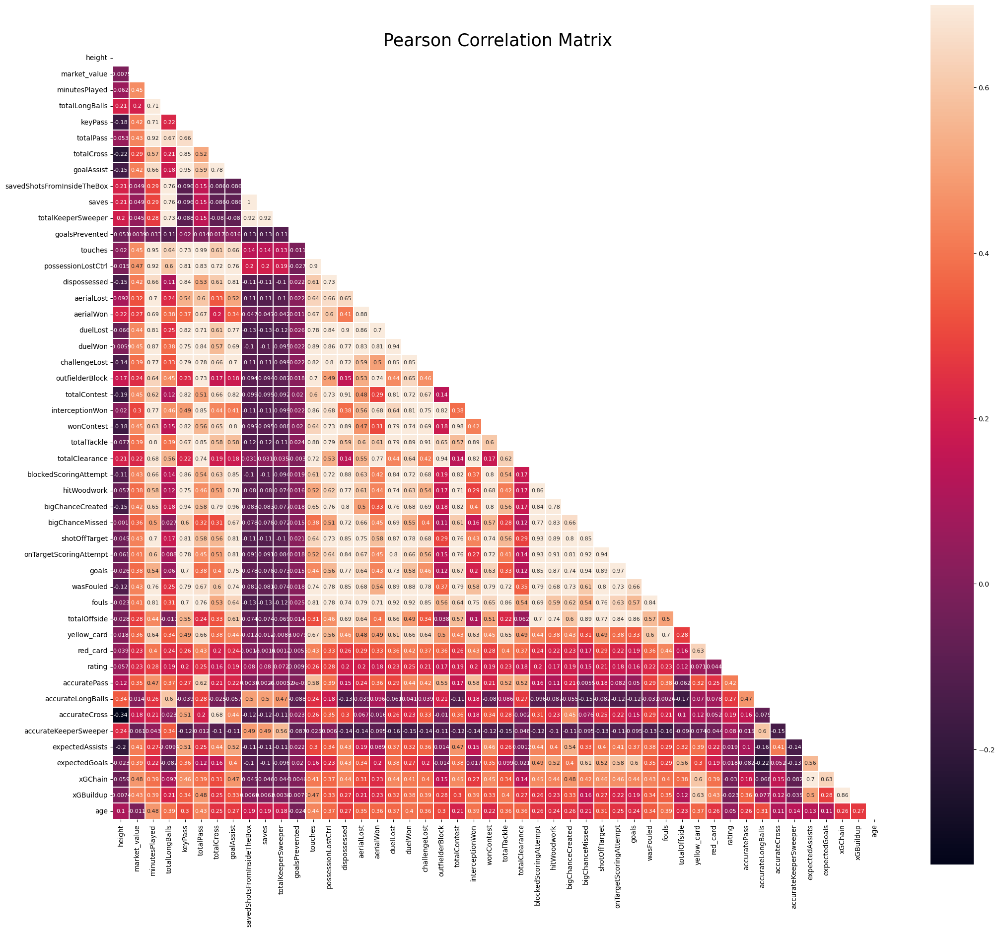

In [35]:
features = quant_f
mask = np.zeros_like(train[features].corr(),dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f,ax = plt.subplots(figsize=(25,25))
plt.title('Pearson Correlation Matrix',fontsize=25)

sns.heatmap(train[features].corr(),linewidths=0.25,vmax=0.7,square=True,linecolor='w',annot=True,annot_kws={'size':8},
            mask=mask,cbar_kws={'shrink':.9})